In [19]:
! pip install ultralytics --upgrade --quiet

In [21]:
# YOLO model
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import numpy as np


In [23]:
# Path to the trained model
trained_model_path = '../yolo/best.pt'  # Update with your model path

# Initialize the YOLO model
yolo_model = YOLO(trained_model_path)

In [25]:
def generate_bbox(img_path, conf_thres=0.3):
    '''
    Generate bounding boxes for detected objects in the image using YOLO model.
    
    Args:
        img_path: Path to the image file.
        conf_thres: Confidence threshold for object detection.
        
    Returns:
        results: List of tuples containing (class, confidence score, (xmin, ymin, xmax, ymax)).
    '''
    results = yolo_model(img_path, conf=conf_thres)
    output = []
    for result in results[0].boxes:
        cls = result.cls.item()
        score = result.conf.item()
        bbox = result.xyxy[0].cpu().numpy().astype(int)
        class_name = yolo_model.names[int(cls)]
        output.append((class_name, score, bbox))
    return output

In [27]:
def extract_clothes(img_path: str): 
    '''
    Extract Topwear, Bottomwear, and Footwear from a given image.
    
    Args:
        img_path: Path to the image file.
        
    Returns:
        outputs: Dictionary containing detected object class as keys and the image slice as values. Also contains the original image.
    '''
    try:
        image = Image.open(img_path).convert('RGB')  # Ensure image is in RGB format
        image_np = np.array(image)
    except Exception as e:
        print(f"Error opening image: {e}")
        return {}

    results = generate_bbox(img_path, conf_thres=0.3)
    outputs = {"original_image": image_np}
    for result in results:
        class_name, score, bbox = result
        XMIN, YMIN, XMAX, YMAX = bbox
        print(f"Detected {class_name} with confidence {score} at [{XMIN}, {YMIN}, {XMAX}, {YMAX}]")
        
        # Ensure bounding box coordinates are within image bounds
        XMIN = max(0, XMIN)
        YMIN = max(0, YMIN)
        XMAX = min(image_np.shape[1], XMAX)
        YMAX = min(image_np.shape[0], YMAX)
        
        # Extract the region of interest
        extracted_image = image_np[YMIN:YMAX, XMIN:XMAX]
        
        # Store the extracted image based on class name
        outputs[class_name.lower()] = extracted_image
    
    return outputs

In [29]:
def plot_clothes(**images):
    '''
    Plot a dictionary of images in a row.
    
    Args:
        images: Dictionary containing image names and images in numpy.ndarray format.
    '''
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.axis("off")
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()


image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_faldas_818.png: 640x512 1 Topwear, 1 Bottomwear, 2 Footwears, 98.4ms
Speed: 4.0ms preprocess, 98.4ms inference, 7.6ms postprocess per image at shape (1, 3, 640, 512)
Detected Bottomwear with confidence 0.8828758001327515 at [545, 422, 729, 671]
Detected Topwear with confidence 0.874140202999115 at [503, 216, 721, 461]
Detected Footwear with confidence 0.8475421667098999 at [700, 891, 786, 1073]
Detected Footwear with confidence 0.8375357985496521 at [576, 885, 649, 1066]


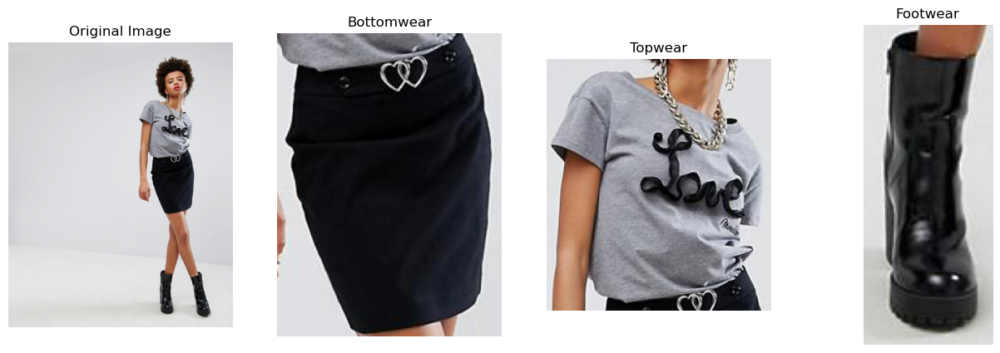

In [31]:
# Test on one image 

# Load the YOLO model
yolo_model = YOLO('../yolo/best.pt')  # YOLO trained model path

# Path to the uploaded image
img_path = '../yolo/ecommerce_dataset/test/images/dataset_faldas_818.png'  # Update with the correct path if necessary

extracted_clothes = extract_clothes(img_path)
if extracted_clothes:
    plot_clothes(**extracted_clothes)


Processing image: ../yolo/ecommerce_dataset/test/images/dataset_shorts_1883.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_shorts_1883.png: 640x512 1 Bottomwear, 86.9ms
Speed: 2.8ms preprocess, 86.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 512)
Detected Bottomwear with confidence 0.8917748928070068 at [111, 274, 691, 726]


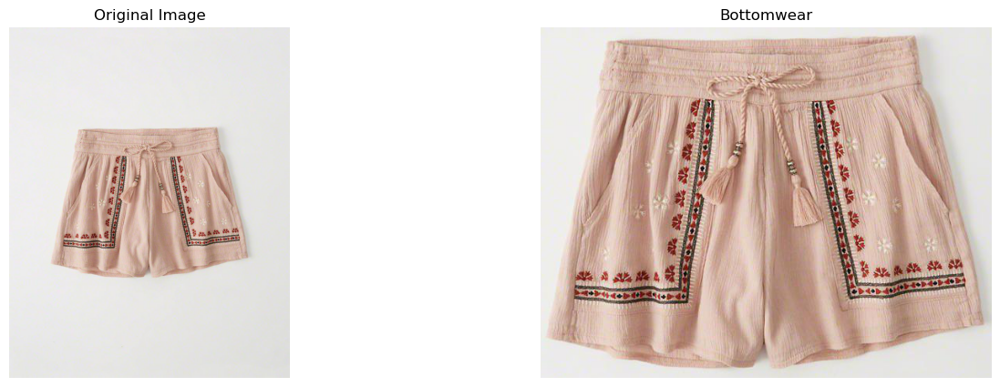

Processing image: ../yolo/ecommerce_dataset/test/images/dataset_abrigos_2523.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_abrigos_2523.png: 640x512 1 Topwear, 1 Bottomwear, 79.3ms
Speed: 2.0ms preprocess, 79.3ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 512)
Detected Topwear with confidence 0.8979825377464294 at [204, 187, 746, 949]
Detected Bottomwear with confidence 0.8742305040359497 at [325, 774, 708, 1109]


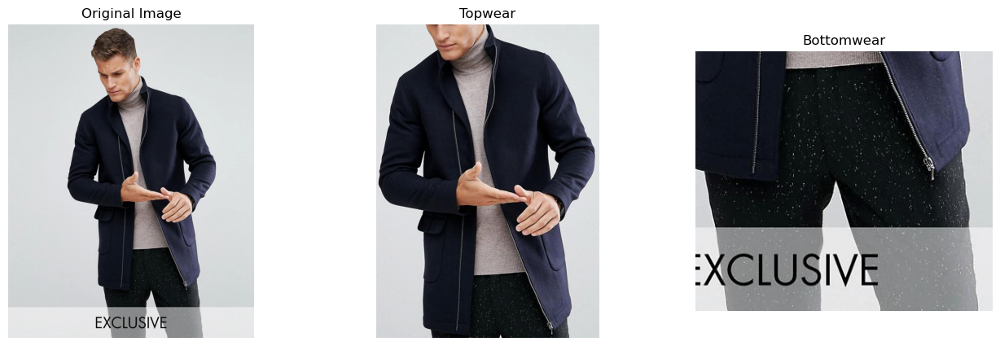

Processing image: ../yolo/ecommerce_dataset/test/images/dataset_abrigos_1524.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_abrigos_1524.png: 640x448 1 Topwear, 72.3ms
Speed: 2.0ms preprocess, 72.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 448)
Detected Topwear with confidence 0.9191160798072815 at [112, 262, 974, 1366]


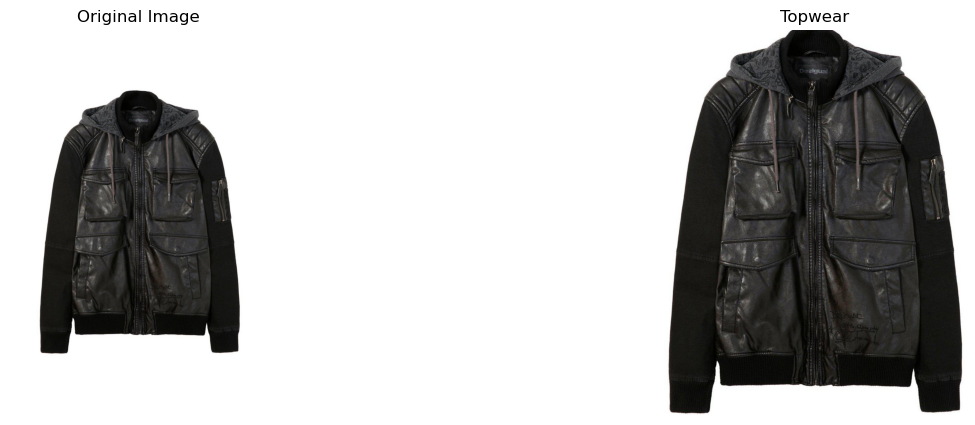

Processing image: ../yolo/ecommerce_dataset/test/images/dataset_sudaderas_916.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_sudaderas_916.png: 640x512 1 Topwear, 1 Bottomwear, 79.1ms
Speed: 2.0ms preprocess, 79.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 512)
Detected Topwear with confidence 0.9196113348007202 at [6, 211, 591, 931]
Detected Bottomwear with confidence 0.9010493159294128 at [79, 880, 520, 1110]


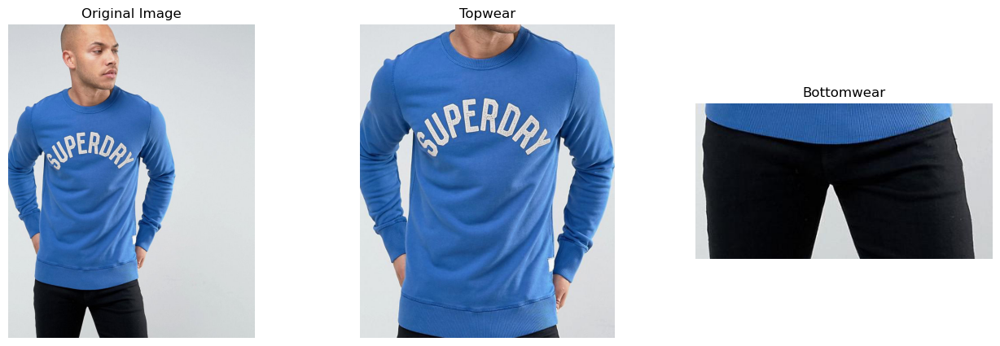

Processing image: ../yolo/ecommerce_dataset/test/images/dataset_camisetas_4818.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_camisetas_4818.png: 640x448 1 Topwear, 1 Bottomwear, 82.5ms
Speed: 2.5ms preprocess, 82.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 448)
Detected Topwear with confidence 0.8891021013259888 at [231, 573, 1206, 2061]
Detected Bottomwear with confidence 0.8740701675415039 at [392, 1893, 1096, 2528]


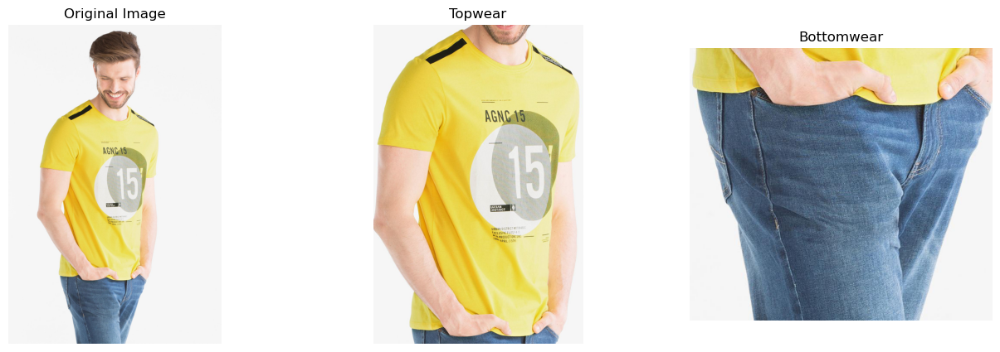

Processing image: ../yolo/ecommerce_dataset/test/images/dataset_pantalones_4137.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_pantalones_4137.png: 640x512 1 Topwear, 1 Bottomwear, 2 Footwears, 82.1ms
Speed: 1.9ms preprocess, 82.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 512)
Detected Bottomwear with confidence 0.8961725831031799 at [239, 81, 635, 851]
Detected Footwear with confidence 0.8876177072525024 at [201, 811, 435, 1024]
Detected Footwear with confidence 0.8304793238639832 at [528, 687, 666, 948]
Detected Topwear with confidence 0.7449030876159668 at [168, 0, 716, 186]


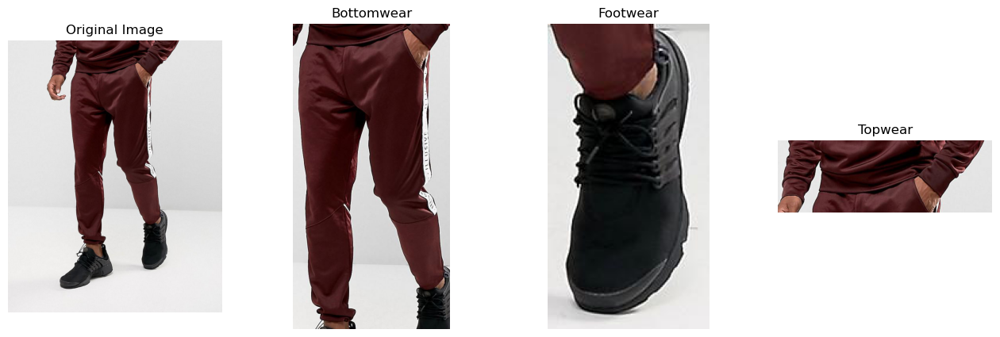

Processing image: ../yolo/ecommerce_dataset/test/images/dataset_pantalones_3952.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_pantalones_3952.png: 640x544 1 Bottomwear, 2 Footwears, 84.9ms
Speed: 2.2ms preprocess, 84.9ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 544)
Detected Bottomwear with confidence 0.9083231687545776 at [125, 22, 322, 454]
Detected Footwear with confidence 0.8877153396606445 at [244, 429, 321, 542]
Detected Footwear with confidence 0.8688499331474304 at [156, 432, 240, 530]


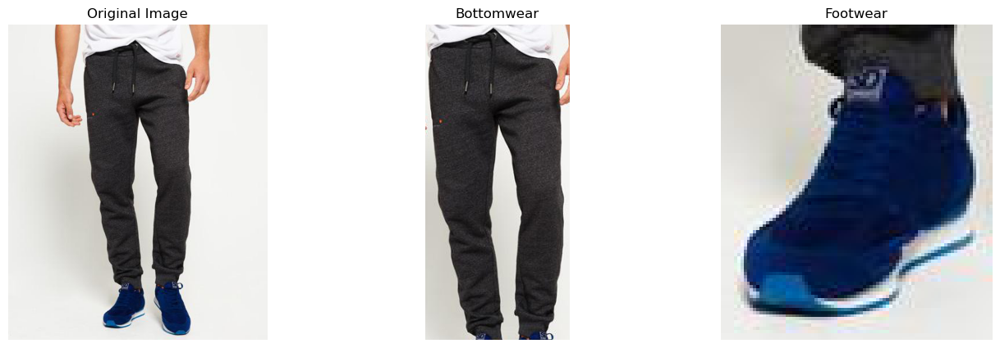

Processing image: ../yolo/ecommerce_dataset/test/images/dataset_vestidos_4825.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_vestidos_4825.png: 640x448 1 Topwear, 66.5ms
Speed: 1.9ms preprocess, 66.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 448)
Detected Topwear with confidence 0.86335289478302 at [241, 99, 1432, 2384]


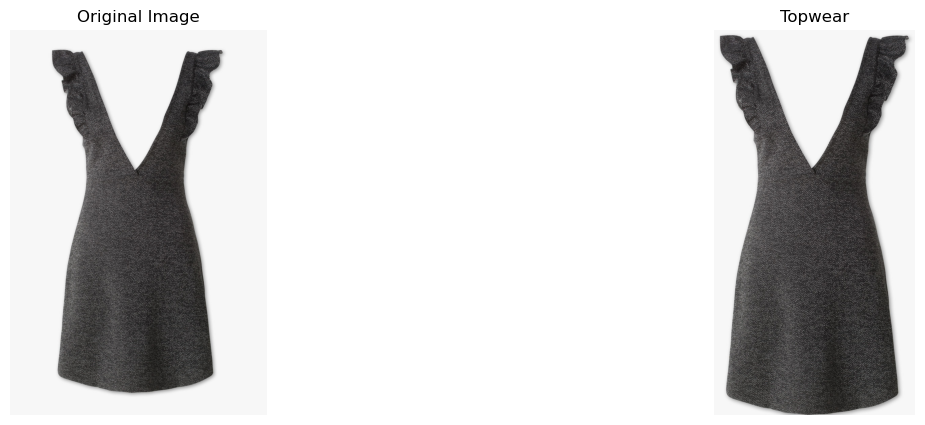

Processing image: ../yolo/ecommerce_dataset/test/images/dataset_pantalones_876.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_pantalones_876.png: 640x544 1 Bottomwear, 2 Footwears, 83.7ms
Speed: 1.7ms preprocess, 83.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 544)
Detected Bottomwear with confidence 0.8996769785881042 at [118, 46, 311, 451]
Detected Footwear with confidence 0.8572665452957153 at [135, 421, 221, 531]
Detected Footwear with confidence 0.8423337340354919 at [245, 431, 312, 538]


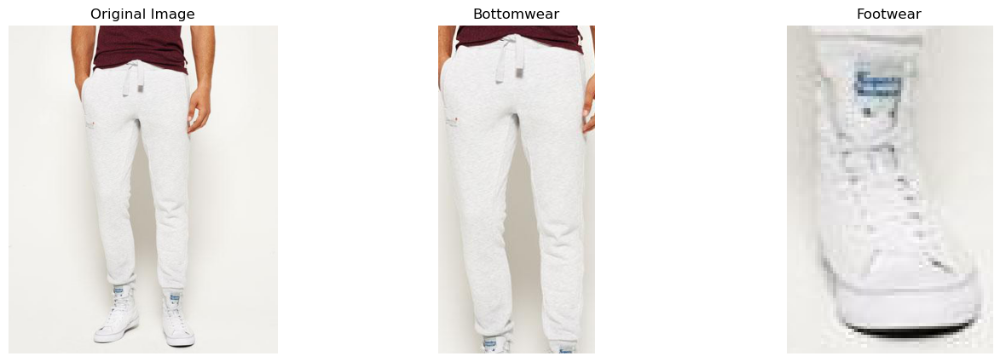

Processing image: ../yolo/ecommerce_dataset/test/images/dataset_camisas-y-blusas_3559.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_camisas-y-blusas_3559.png: 640x512 2 Topwears, 82.1ms
Speed: 2.1ms preprocess, 82.1ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 512)
Detected Topwear with confidence 0.8711822032928467 at [159, 127, 469, 476]
Detected Topwear with confidence 0.4802038371562958 at [246, 345, 393, 749]


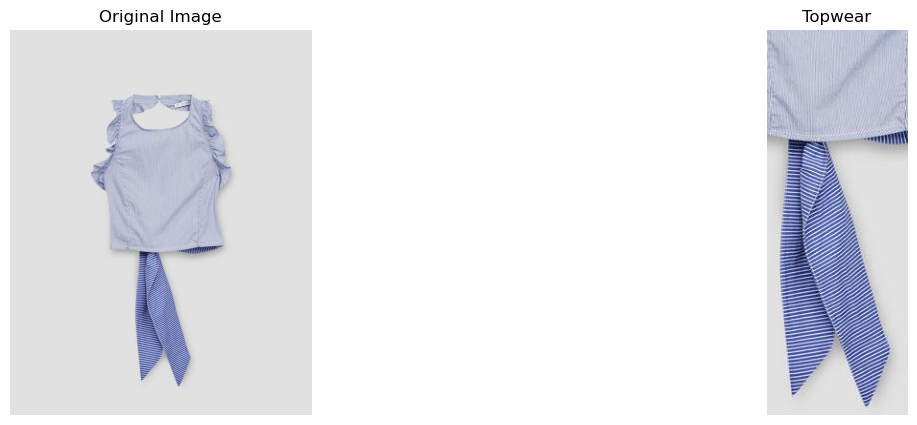

Processing image: ../yolo/ecommerce_dataset/test/images/dataset_pantalones_4435.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_pantalones_4435.png: 640x448 1 Bottomwear, 152.7ms
Speed: 50.3ms preprocess, 152.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 448)
Detected Bottomwear with confidence 0.932386040687561 at [216, 164, 862, 1473]


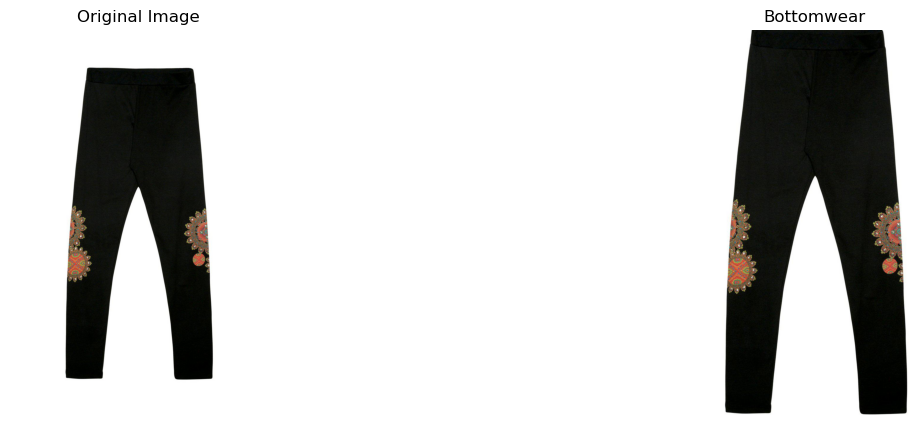

Processing image: ../yolo/ecommerce_dataset/test/images/dataset_sudaderas_2052.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_sudaderas_2052.png: 640x512 1 Topwear, 1 Bottomwear, 74.2ms
Speed: 1.8ms preprocess, 74.2ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 512)
Detected Topwear with confidence 0.9116019606590271 at [111, 252, 701, 944]
Detected Bottomwear with confidence 0.8716949224472046 at [238, 877, 517, 1109]


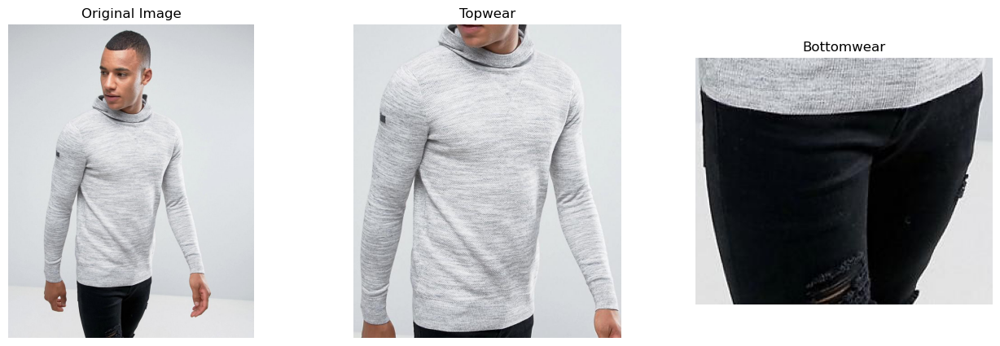

Processing image: ../yolo/ecommerce_dataset/test/images/dataset_sudaderas_5510.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_sudaderas_5510.png: 640x480 1 Topwear, 73.7ms
Speed: 1.7ms preprocess, 73.7ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 480)
Detected Topwear with confidence 0.9291108250617981 at [176, 170, 807, 862]


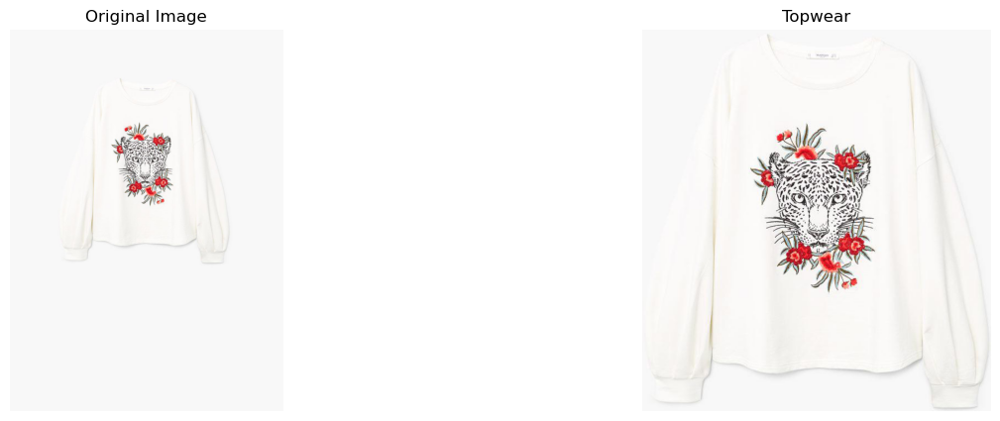

Processing image: ../yolo/ecommerce_dataset/test/images/dataset_jeans_3489.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_jeans_3489.png: 640x448 1 Topwear, 1 Bottomwear, 2 Footwears, 72.7ms
Speed: 1.8ms preprocess, 72.7ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 448)
Detected Topwear with confidence 0.9048417806625366 at [116, 97, 269, 296]
Detected Bottomwear with confidence 0.9028308987617493 at [134, 213, 248, 503]
Detected Footwear with confidence 0.79313725233078 at [142, 495, 181, 575]
Detected Footwear with confidence 0.7896749377250671 at [196, 487, 233, 574]


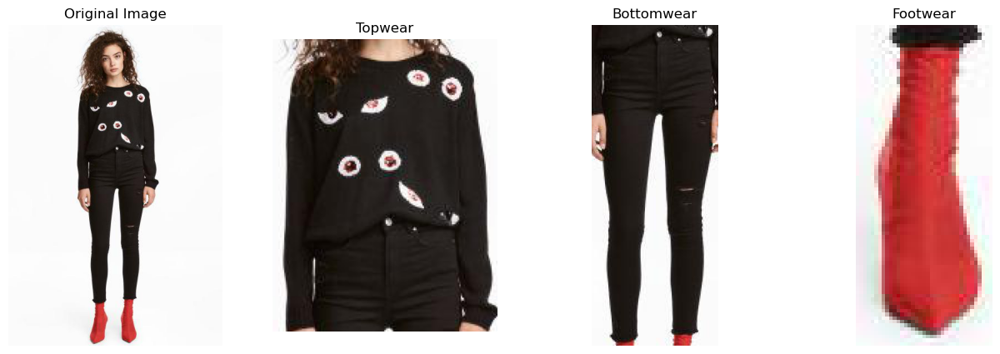

Processing image: ../yolo/ecommerce_dataset/test/images/dataset_faldas_2018.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_faldas_2018.png: 640x544 1 Bottomwear, 87.8ms
Speed: 1.8ms preprocess, 87.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 544)
Detected Bottomwear with confidence 0.8444529175758362 at [130, 203, 433, 495]


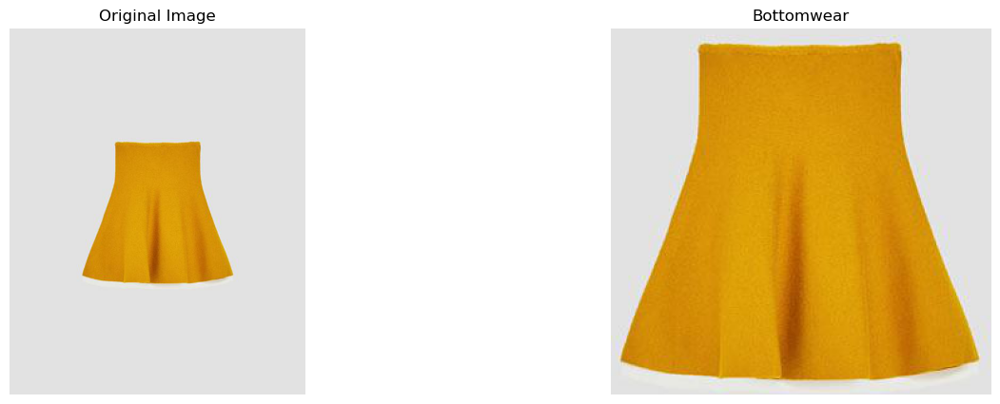

Processing image: ../yolo/ecommerce_dataset/test/images/dataset_vestidos_3528.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_vestidos_3528.png: 640x512 1 Topwear, 80.0ms
Speed: 1.9ms preprocess, 80.0ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 512)
Detected Topwear with confidence 0.8328861594200134 at [55, 221, 533, 1049]


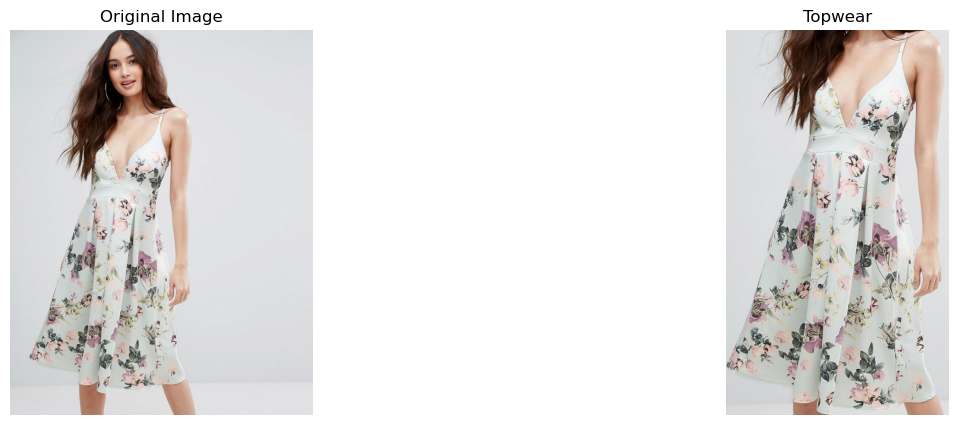

Processing image: ../yolo/ecommerce_dataset/test/images/dataset_monos_609.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_monos_609.png: 640x512 1 Bottomwear, 85.1ms
Speed: 2.0ms preprocess, 85.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 512)
Detected Bottomwear with confidence 0.6875673532485962 at [250, 256, 740, 1069]


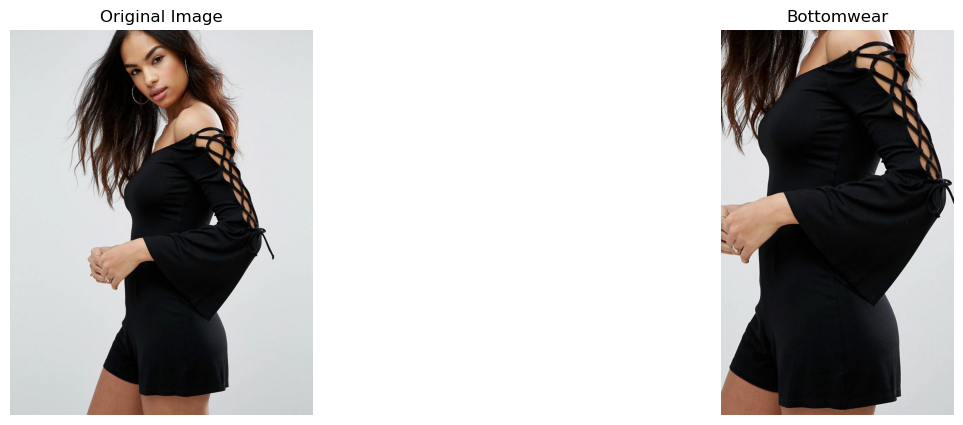

Processing image: ../yolo/ecommerce_dataset/test/images/dataset_vestidos_68.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_vestidos_68.png: 640x544 1 Topwear, 1 Bottomwear, 79.0ms
Speed: 1.7ms preprocess, 79.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 544)
Detected Bottomwear with confidence 0.8309723138809204 at [132, 247, 293, 514]
Detected Topwear with confidence 0.7698692083358765 at [158, 89, 273, 263]


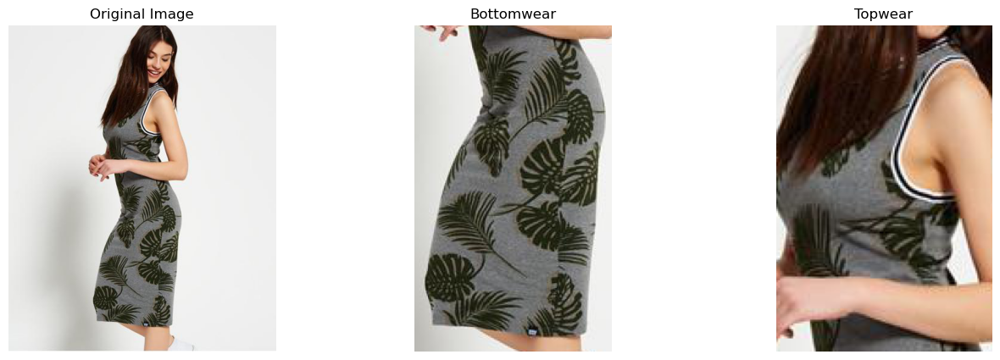

Processing image: ../yolo/ecommerce_dataset/test/images/dataset_shorts_2750.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_shorts_2750.png: 640x512 1 Topwear, 1 Bottomwear, 1 Footwear, 82.5ms
Speed: 1.8ms preprocess, 82.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 512)
Detected Topwear with confidence 0.7437686324119568 at [418, 184, 844, 789]
Detected Footwear with confidence 0.709628701210022 at [333, 1032, 436, 1109]
Detected Bottomwear with confidence 0.4023873209953308 at [459, 465, 812, 796]


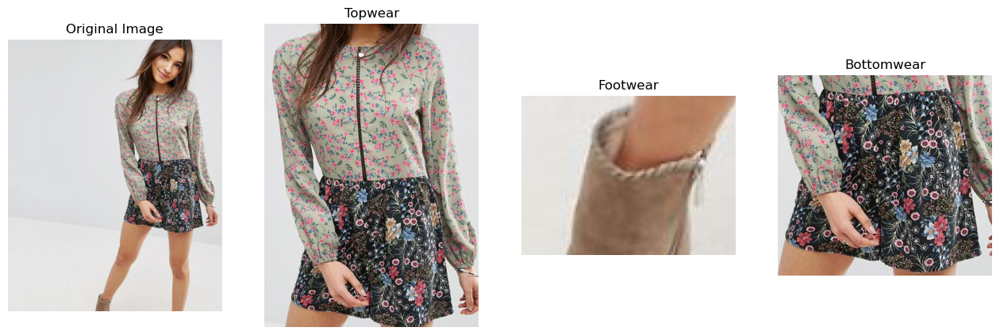

Processing image: ../yolo/ecommerce_dataset/test/images/dataset_camisas-y-blusas_3580.png

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/test/images/dataset_camisas-y-blusas_3580.png: 640x448 1 Topwear, 1 Bottomwear, 60.9ms
Speed: 1.9ms preprocess, 60.9ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 448)
Detected Bottomwear with confidence 0.8758018612861633 at [332, 1622, 1238, 2211]
Detected Topwear with confidence 0.835456132888794 at [387, 624, 1153, 1760]


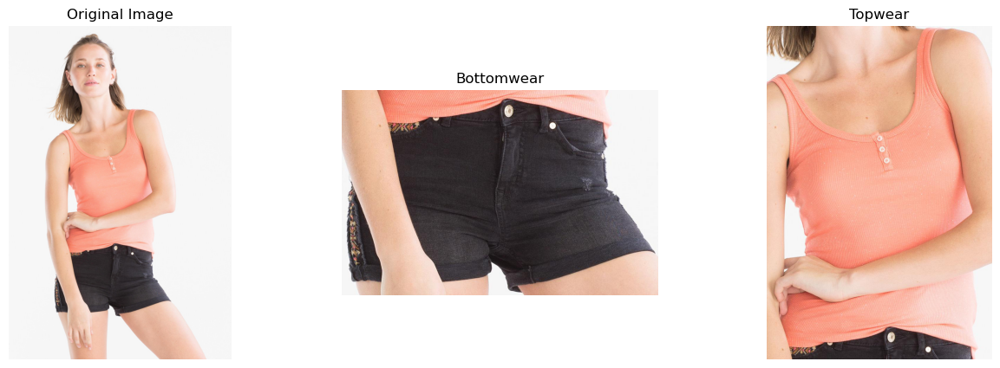

In [15]:
# Test on 10 Random Images 
import os
import random

# Path to the uploaded image
img_dir = '../yolo/ecommerce_dataset/test/images'  

# Get list of all image files in the directory
image_files = [f for f in os.listdir(img_dir) if f.endswith('.png')]

# Select 10 random images
random_images = random.sample(image_files, 20)

# Process each random image
for img_file in random_images:
    img_path = os.path.join(img_dir, img_file)
    print(f"Processing image: {img_path}")
    
    # Extract clothes and plot results
    extracted_clothes = extract_clothes(img_path)
    if extracted_clothes:
        plot_clothes(**extracted_clothes)


In [33]:
# Gender Classification Model

import torch
import torch.nn as nn
from PIL import Image
from torchvision import models,transforms

In [35]:
# Define the gender model

class GenderClassificationModel(nn.Module):
    def __init__(self):
        super(GenderClassificationModel, self).__init__()
        self.model = models.resnet50(pretrained=True)
        for param in self.model.parameters():
            param.requires_grad = False  # Freeze the layers
        num_features = self.model.fc.in_features
        self.model.fc = nn.Linear(num_features, 2)
    
    def forward(self, x):
        return self.model(x)

gender_model = GenderClassificationModel()

/opt/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [37]:
# Load the state dictionary
state_dict = torch.load('../gender_classification_model/gender_classification_model.pth')
gender_model.load_state_dict(state_dict)
gender_model.eval()  # Set the model to evaluation mode

# Define data transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Function to load and preprocess image
def load_and_preprocess_image(img_path):
    img = Image.open(img_path).convert('RGB')
    img = transform(img)
    img = img.unsqueeze(0)  # Add batch dimension
    return img

# Function to predict gender
def predict_gender(img_path):
    img = load_and_preprocess_image(img_path)
    with torch.no_grad():
        output = gender_model(img)
        # Assuming the model output is a probability for male
        # Change this logic based on your model's output
        _, predicted = torch.max(output, 1)
        if predicted.item() == 0:  # 1 = 'Male' 0 = 'Female'
            return 'men'
        else:
            return 'women'

In [39]:
# Recommandaion system 
import os
import time
import requests
from io import BytesIO
from PIL import Image
import pandas as pd
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity, pairwise_distances
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import cv2
import pickle
from sklearn.manifold import TSNE
import seaborn as sns

In [105]:
# Load the saved embeddings and DataFrame
with open('../embeddings/embeddings-new.pkl', 'rb') as f:
    embeddings = pickle.load(f)
print(f"Loaded embeddings with shape: {embeddings.shape}")

df = pd.read_csv('../embeddings/dataset_with_embeddings-new.csv')
print("Loaded DataFrame:")
print(df.head())


Loaded embeddings with shape: (26486, 2048)
Loaded DataFrame:
                        _id                    code  \
0  668dad59e415d9bc6a43c684   TERMINALX-z3819400069   
1  668dad59e415d9bc6a43c685  TERMINALX-x59233000510   
2  668dad59e415d9bc6a43c686  TERMINALX-z84857001720   
3  668dad59e415d9bc6a43c687   TERMINALX-w3387500014   
4  668dad59e415d9bc6a43c688   TERMINALX-z9270000069   

                                                 img  \
0  https://media.terminalx.com/pub/media/catalog/...   
1  https://media.terminalx.com/pub/media/catalog/...   
2  https://media.terminalx.com/pub/media/catalog/...   
3  https://media.terminalx.com/pub/media/catalog/...   
4  https://media.terminalx.com/pub/media/catalog/...   

                                 title     price  \
0  גופיית ווש עם שוליים גזורים / גברים   49.95 ₪   
1                       גופייה עם לוגו   83.93 ₪   
2          גופייה עם הדפס לוגו / גברים   83.93 ₪   
3                     חולצת פולו סרוגה  230.93 ₪   
4         

In [107]:
# Compute cosine similarity between all embeddings
cosine_sim = 1 - pairwise_distances(embeddings, metric='cosine')

In [29]:
# Apply t-SNE to reduce the dimensionality of the embeddings to 2D
tsne = TSNE(n_components=2, random_state=42)
tsne_embeddings = tsne.fit_transform(embeddings)

# Add t-SNE results to the dataframe
df['tsne-2d-one'] = tsne_embeddings[:, 0]
df['tsne-2d-two'] = tsne_embeddings[:, 1]

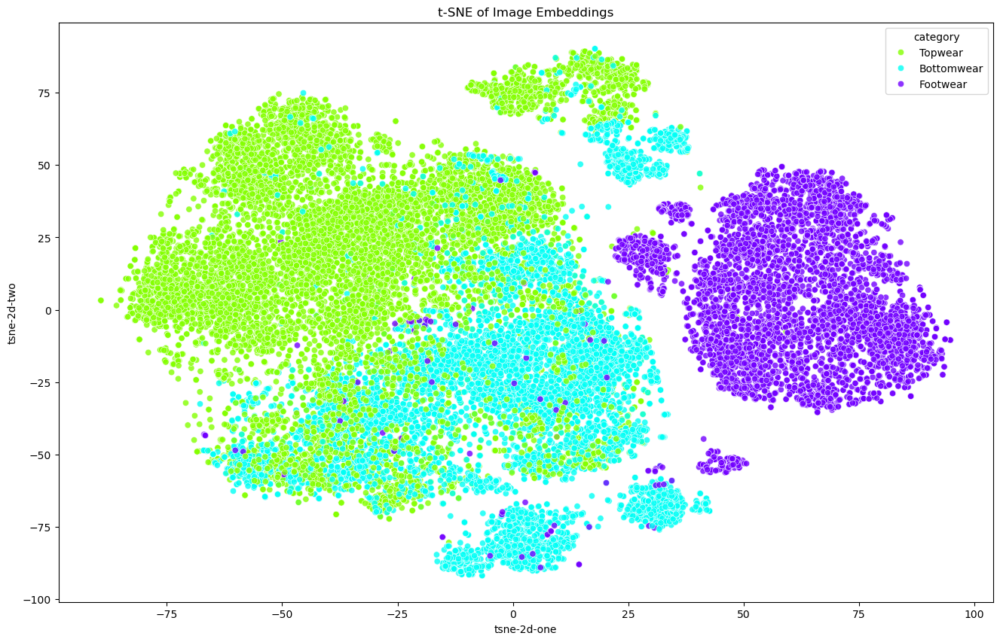

In [45]:
# Plot t-SNE results - by Category
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="category",  # Change this to any column you want to color by
    palette=sns.color_palette("hsv", len(df['category'].unique())),
    data=df,
    legend="full",
    alpha=0.8
)
plt.title('t-SNE of Image Embeddings')
plt.show()


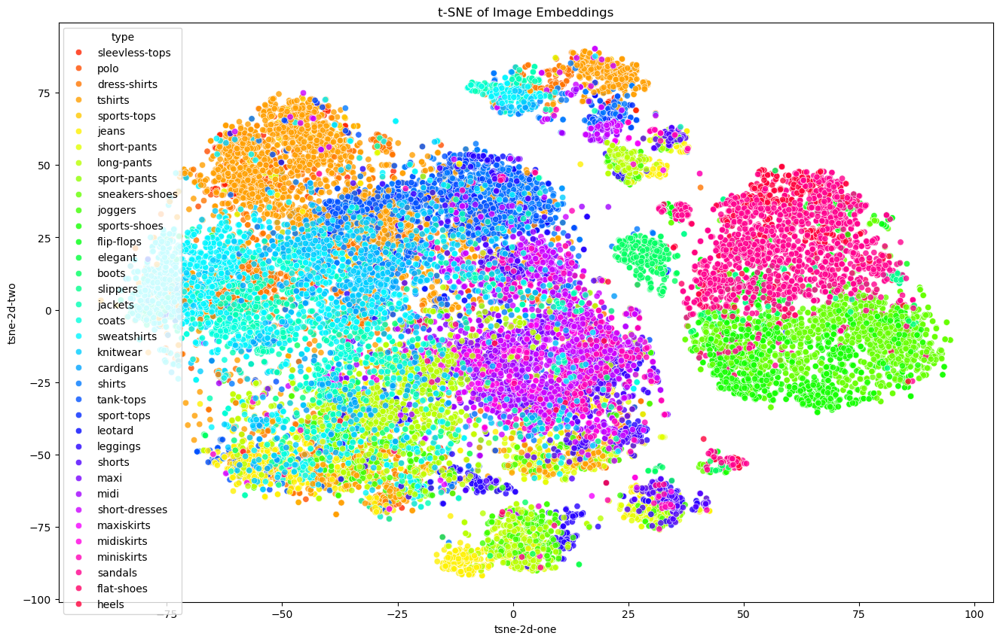

In [47]:
# Plot t-SNE results - by Product Type
plt.figure(figsize=(16, 10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="type",  # Change this to any column you want to color by
    palette=sns.color_palette("hsv", len(df['type'].unique())),
    data=df,
    legend="full",
    alpha=0.8
)
plt.title('t-SNE of Image Embeddings')
plt.show()

In [44]:
# Load the pre-trained ResNet50 model without the top layers
print("Loading ResNet50 model...")
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
embedding_model = Model(inputs=base_model.input, outputs=x)
print("Model loaded.")


Loading ResNet50 model...
Model loaded.


In [59]:
# Function to preprocess image and generate embedding
def get_embedding_from_image(model, img):
    try:
        img = cv2.resize(img, (224, 224))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = preprocess_input(img_array)
        embedding = model.predict(img_array)
        return embedding.flatten()
    except Exception as e:
        print(f"Error processing image: {e}")
        return np.zeros(model.output_shape[1])

In [109]:
# Function to get recommendations based on cosine similarity
def get_recommender(test_embedding, embeddings, df, top_n=5):
    test_embedding_reshaped = test_embedding.reshape(1, -1)
    similarities = cosine_similarity(embeddings, test_embedding_reshaped).flatten()
    sim_scores = sorted(enumerate(similarities), key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[:top_n+1] if sim_scores[0][1] < 1.0 else sim_scores[1:top_n+1]
    idx_rec = [i[0] for i in sim_scores[:top_n]]
    sim_values = [i[1] for i in sim_scores[:top_n]]
    recommended_items = df.iloc[idx_rec]
    return recommended_items, sim_values


In [132]:
# Plotting function
def plot_images(test_image_path, recommended_items, title):
    fig, axes = plt.subplots(1, len(recommended_items) + 1, figsize=(20, 5))
    # Plot the test image
    img = Image.open(test_image_path)
    axes[0].imshow(img)
    axes[0].set_title("Test Image")
    axes[0].axis('off')
    
    # Plot the recommended images
    for i, (index, row) in enumerate(recommended_items.iterrows(), start=1):
        img = Image.open(row['image_path'])
        axes[i].imshow(img)
        axes[i].set_title(f"Recommendation {i}")
        axes[i].axis('off')
    
    plt.suptitle(title)
    plt.show()

Processing image: ../yolo/ecommerce_dataset/train/images/dataset_abrigos_120.png
Detected gender: men

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/train/images/dataset_abrigos_120.png: 640x512 1 Topwear, 1 Bottomwear, 75.2ms
Speed: 2.5ms preprocess, 75.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 512)
Detected Bottomwear with confidence 0.8934180736541748 at [15, 736, 360, 1110]
Detected Topwear with confidence 0.8754010200500488 at [0, 177, 535, 1086]


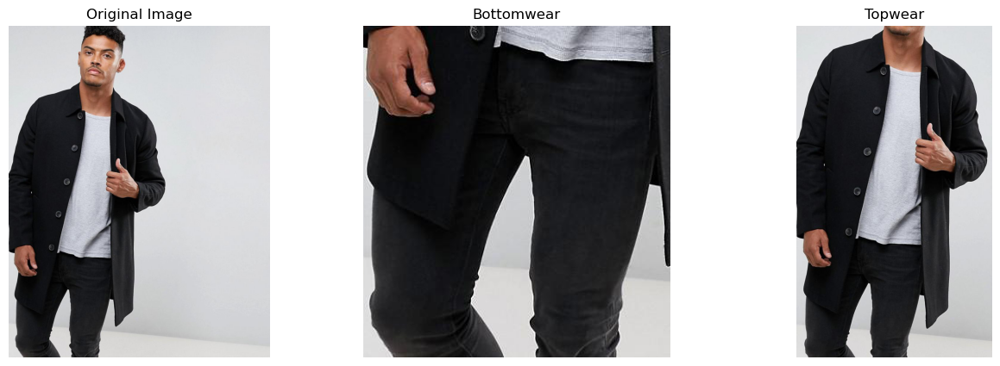

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
Recommended Topwear:
              type color gender category
1502  dress-shirts     9    men  Topwear
7422       jackets     4    men  Topwear
7469       jackets     4    men  Topwear
7143         coats     4    men  Topwear
7163       jackets     4    men  Topwear


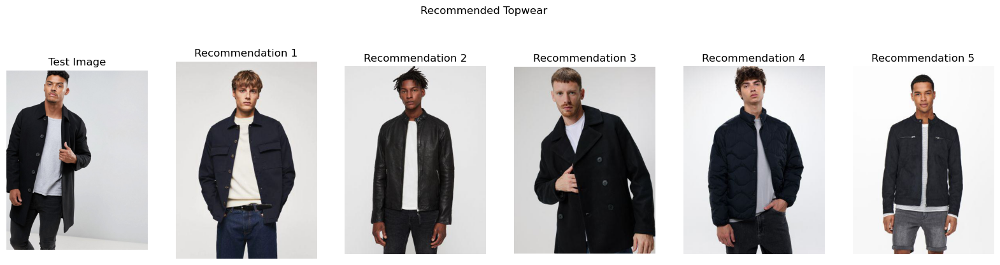

Recommended Bottomwear:
            type  color gender    category
1794       jeans      4    men  Bottomwear
3680  long-pants      4    men  Bottomwear
3225  long-pants  21428    men  Bottomwear
1981       jeans  10972    men  Bottomwear
3494  long-pants      4    men  Bottomwear


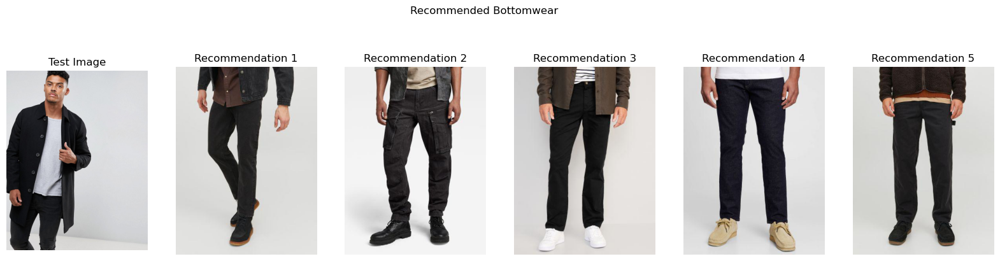

Processing image: ../yolo/ecommerce_dataset/train/images/dataset_abrigos_260.png
Detected gender: men

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/train/images/dataset_abrigos_260.png: 640x512 1 Topwear, 1 Bottomwear, 73.8ms
Speed: 1.9ms preprocess, 73.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 512)
Detected Topwear with confidence 0.9239026308059692 at [44, 196, 676, 1047]
Detected Bottomwear with confidence 0.8651624917984009 at [188, 887, 563, 1110]


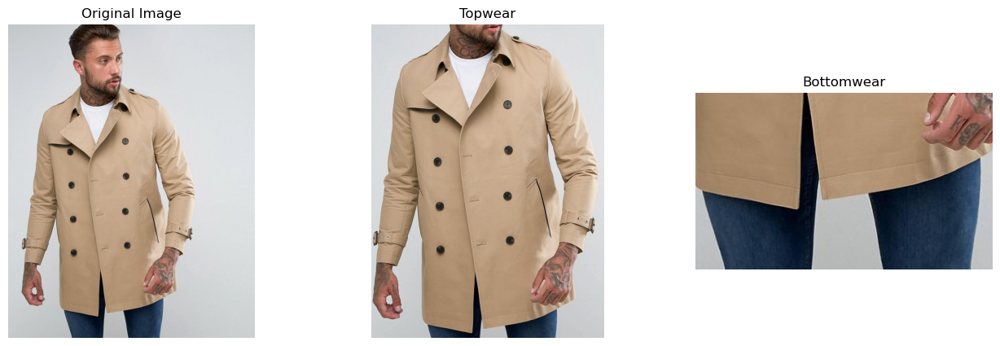

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
Recommended Topwear:
              type  color gender category
7331       jackets   8329    men  Topwear
7469       jackets      4    men  Topwear
1689  dress-shirts    106    men  Topwear
7389       jackets   8329    men  Topwear
761   dress-shirts  17762    men  Topwear


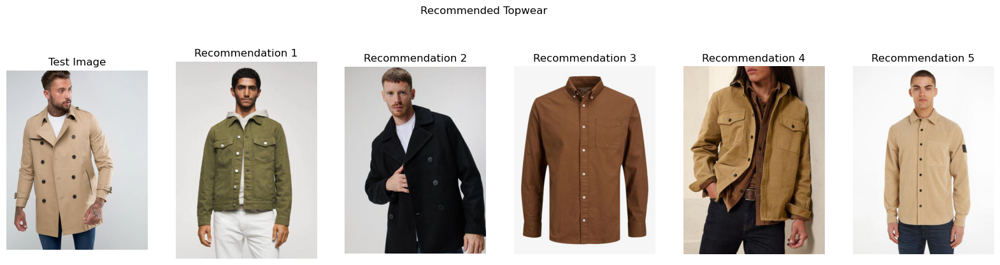

Recommended Bottomwear:
             type  color gender    category
3030  short-pants      4    men  Bottomwear
2472  short-pants     22    men  Bottomwear
2981  short-pants      9    men  Bottomwear
1645        jeans  10008    men  Bottomwear
1724        jeans   2148    men  Bottomwear


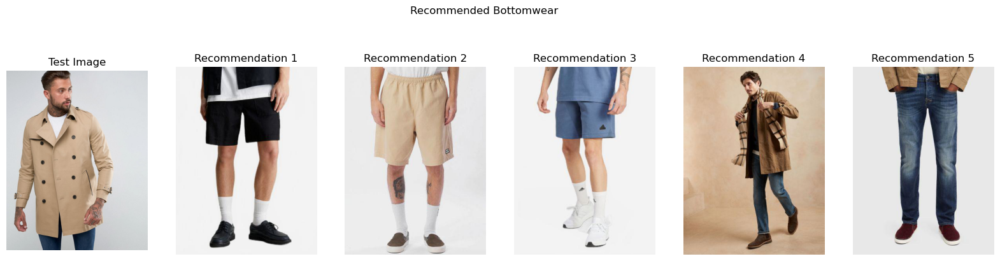

Processing image: ../yolo/ecommerce_dataset/train/images/dataset_camisas-y-blusas_88.png
Detected gender: women

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/train/images/dataset_camisas-y-blusas_88.png: 640x448 1 Topwear, 1 Bottomwear, 68.8ms
Speed: 3.0ms preprocess, 68.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 448)
Detected Bottomwear with confidence 0.8672154545783997 at [370, 2008, 1403, 2529]
Detected Topwear with confidence 0.8520300388336182 at [323, 550, 1485, 2253]


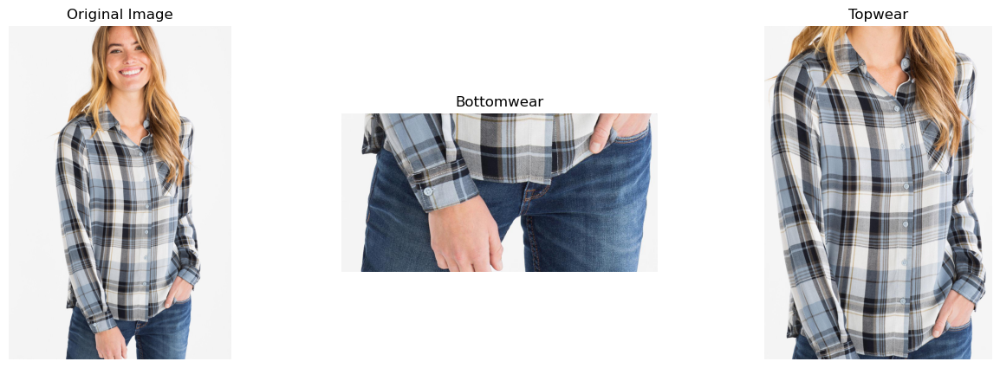

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Recommended Topwear:
               type color gender category
10365  dress-shirts  9445  women  Topwear
24577       jackets   106  women  Topwear
8575         shirts     6  women  Topwear
11434  dress-shirts    70  women  Topwear
10361  dress-shirts     9  women  Topwear


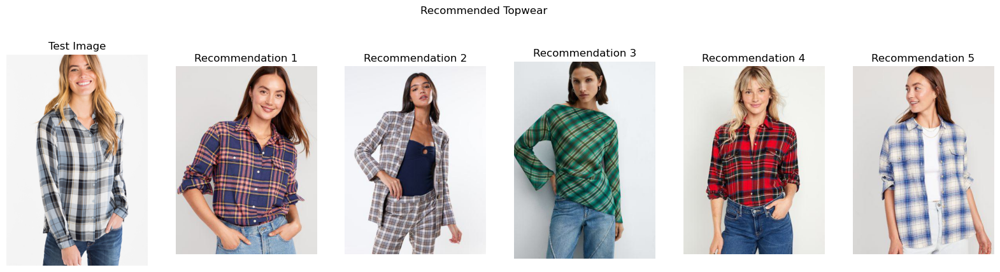

Recommended Bottomwear:
             type color gender    category
14632       jeans     9  women  Bottomwear
13236       jeans  9342  women  Bottomwear
13603       jeans  2060  women  Bottomwear
16439  long-pants    21  women  Bottomwear
13168       jeans     9  women  Bottomwear


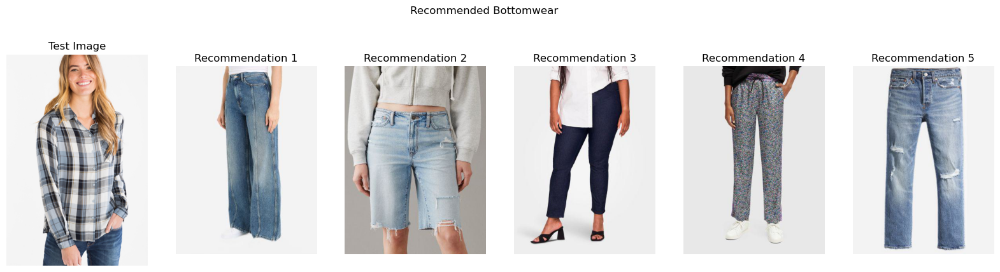

Processing image: ../yolo/ecommerce_dataset/train/images/dataset_vestidos_2232.png
Detected gender: women

image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/train/images/dataset_vestidos_2232.png: 640x448 1 Topwear, 2 Footwears, 64.6ms
Speed: 1.9ms preprocess, 64.6ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 448)
Detected Footwear with confidence 0.8383219242095947 at [881, 2247, 1111, 2514]
Detected Topwear with confidence 0.7862669229507446 at [648, 371, 1219, 1573]
Detected Footwear with confidence 0.7766382694244385 at [450, 2218, 766, 2480]


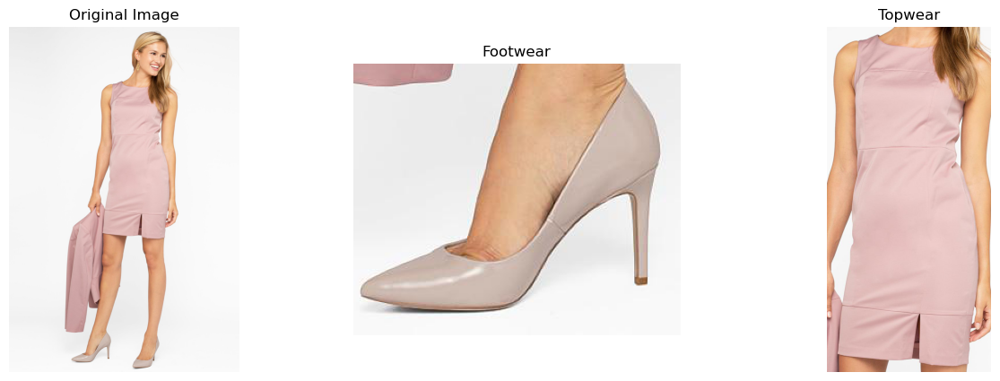

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
Recommended Topwear:
            type  color gender category
11568     shirts  11622  women  Topwear
11545    tshirts   8423  women  Topwear
10640  tank-tops      8  women  Topwear
13937    tshirts     10  women  Topwear
12105  tank-tops  18218  women  Topwear


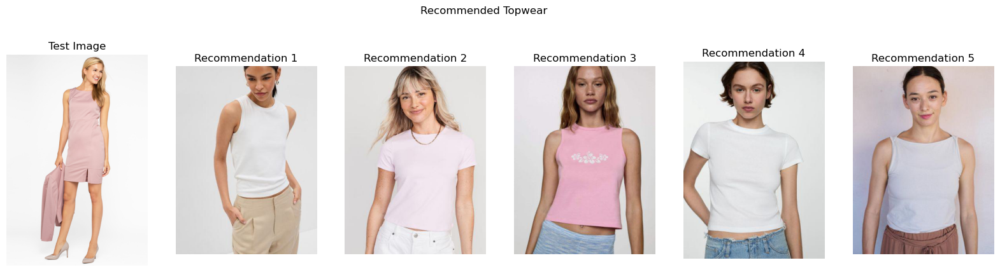

Recommended Footwear:
          type color gender  category
22427    heels  9091  women  Footwear
22487    heels  9091  women  Footwear
24154    boots     4  women  Footwear
20237  sandals   106  women  Footwear
22278  sandals    10  women  Footwear


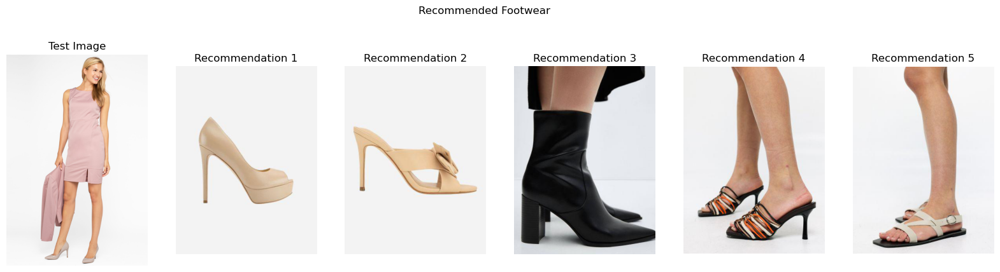

In [136]:
# List of test image paths
test_image_paths = [
    '../yolo/ecommerce_dataset/train/images/dataset_abrigos_120.png',
    '../yolo/ecommerce_dataset/train/images/dataset_abrigos_260.png',
    '../yolo/ecommerce_dataset/train/images/dataset_camisas-y-blusas_88.png',
    '../yolo/ecommerce_dataset/train/images/dataset_vestidos_2232.png',
    # Add more image paths as needed
]

# Loop through each test image
for img_path in test_image_paths:
    print(f"Processing image: {img_path}")
    
    # Predict gender from the original image
    detected_gender = predict_gender(img_path)
    print(f"Detected gender: {detected_gender}")
    
    extracted_clothes = extract_clothes(img_path)
    plot_clothes(**extracted_clothes)
    
    # Generate embeddings for extracted clothes
    topwear_embedding = get_embedding_from_image(embedding_model, extracted_clothes['topwear']) if 'topwear' in extracted_clothes else None
    bottomwear_embedding = get_embedding_from_image(embedding_model, extracted_clothes['bottomwear']) if 'bottomwear' in extracted_clothes else None
    footwear_embedding = get_embedding_from_image(embedding_model, extracted_clothes['footwear']) if 'footwear' in extracted_clothes else None

    # Filter the dataset based on detected gender
    df_gender_filtered = df[df['gender'].str.lower() == detected_gender.lower()]

   # Recommend similar items and plot the results based on gender
    if topwear_embedding is not None:
        topwear_df = df_gender_filtered[df_gender_filtered['category'] == 'Topwear']
        if not topwear_df.empty:
            topwear_embeddings = embeddings[topwear_df.index]
            recommended_topwear, sim_values = get_recommender(topwear_embedding, topwear_embeddings, topwear_df, top_n=5)
            print("Recommended Topwear:")
            print(recommended_topwear[['type', 'color', 'gender', 'category']])
            plot_images(img_path, recommended_topwear, "Recommended Topwear")
        else:
            print("No topwear items found for the detected gender.")

    if bottomwear_embedding is not None:
        bottomwear_df = df_gender_filtered[df_gender_filtered['category'] == 'Bottomwear']
        if not bottomwear_df.empty:
            bottomwear_embeddings = embeddings[bottomwear_df.index]
            recommended_bottomwear, sim_values = get_recommender(bottomwear_embedding, bottomwear_embeddings, bottomwear_df, top_n=5)
            print("Recommended Bottomwear:")
            print(recommended_bottomwear[['type', 'color', 'gender', 'category']])
            plot_images(img_path, recommended_bottomwear, "Recommended Bottomwear")
        else:
            print("No bottomwear items found for the detected gender.")

    if footwear_embedding is not None:
        footwear_df = df_gender_filtered[df_gender_filtered['category'] == 'Footwear']
        if not footwear_df.empty:
            footwear_embeddings = embeddings[footwear_df.index]
            recommended_footwear, sim_values = get_recommender(footwear_embedding, footwear_embeddings, footwear_df, top_n=5)
            print("Recommended Footwear:")
            print(recommended_footwear[['type', 'color', 'gender', 'category']])
            plot_images(img_path, recommended_footwear, "Recommended Footwear")
        else:
            print("No footwear items found for the detected gender.")


In [140]:
# Clustering 
from sklearn.cluster import KMeans
import numpy as np

# Number of clusters
num_clusters = 10  # Adjust this number as needed

# Apply KMeans clustering to the embeddings
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(embeddings)

# Save the cluster centers
cluster_centers = kmeans.cluster_centers_


In [156]:
from sklearn.metrics import pairwise_distances

# Function to calculate uniqueness score
def calculate_uniqueness(embedding, cluster_centers):
    distances = np.linalg.norm(cluster_centers - embedding, axis=1)
    return np.min(distances)

In [158]:
# Function to plot clusters and test image
def plot_clusters_and_test_image(tsne_embeddings, tsne_cluster_centers, test_embedding, cluster_centers):
    tsne = TSNE(n_components=2, perplexity=30, random_state=42)
    all_data = np.vstack([embeddings, cluster_centers, test_embedding.reshape(1, -1)])
    tsne_results = tsne.fit_transform(all_data)

    tsne_embeddings = tsne_results[:len(embeddings)]
    tsne_cluster_centers = tsne_results[len(embeddings):len(embeddings) + len(cluster_centers)]
    tsne_test_embedding = tsne_results[-1]

    tsne_df = pd.DataFrame(tsne_embeddings, columns=['TSNE-1', 'TSNE-2'])
    tsne_df['cluster'] = kmeans.labels_

    tsne_cluster_centers_df = pd.DataFrame(tsne_cluster_centers, columns=['TSNE-1', 'TSNE-2'])

    plt.figure(figsize=(10, 8))
    sns.scatterplot(data=tsne_df, x='TSNE-1', y='TSNE-2', hue='cluster', palette='viridis', s=50)
    sns.scatterplot(data=tsne_cluster_centers_df, x='TSNE-1', y='TSNE-2', color='red', marker='X', s=200, label='Cluster Centers')
    plt.scatter(tsne_test_embedding[0], tsne_test_embedding[1], color='blue', s=100, label='Test Image')
    plt.title('t-SNE Visualization of Clusters and Cluster Centers')
    plt.legend()
    plt.show()

In [160]:
# Perform clustering
num_clusters = 10  # Adjust as needed
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
kmeans.fit(embeddings)
cluster_centers = kmeans.cluster_centers_


image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/train/images/dataset_vestidos_2244.png: 640x512 1 Topwear, 99.2ms
Speed: 3.9ms preprocess, 99.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 512)
Detected Topwear with confidence 0.8361145853996277 at [479, 231, 871, 1053]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
Topwear Uniqueness: 37.91995620727539 (Normalized: 100.00%)


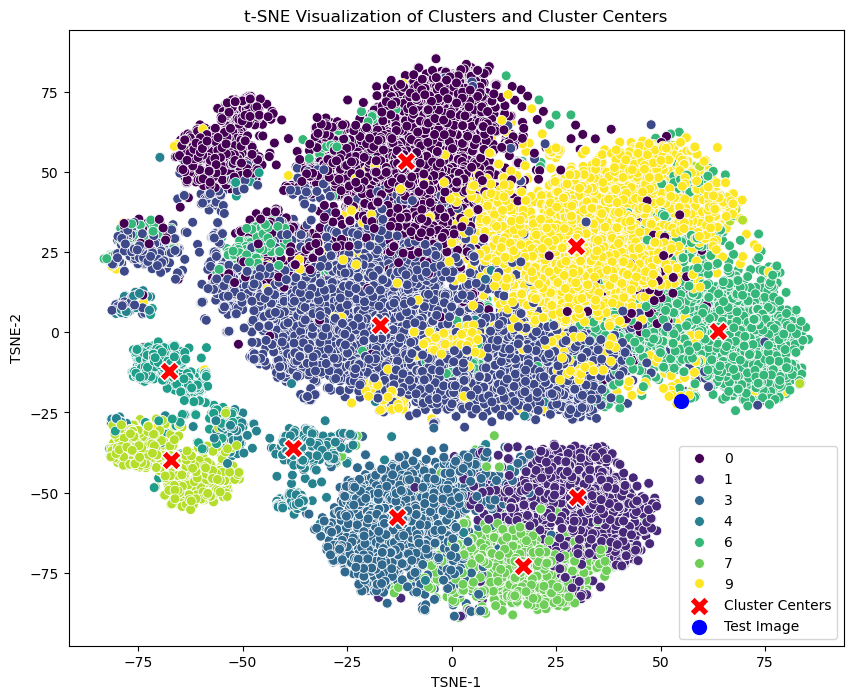

In [176]:
# Dress 
import numpy as np

# Function to calculate maximum possible distance in the embedding space
def calculate_max_distance(embeddings):
    max_distance = 0
    for i in range(len(embeddings)):
        for j in range(i+1, len(embeddings)):
            distance = np.linalg.norm(embeddings[i] - embeddings[j])
            if distance > max_distance:
                max_distance = distance
    return max_distance

# Function to normalize the score
def normalize_score(score, max_distance):
    normalized_score = (score / max_distance) * 100
    return min(100, max(0, normalized_score))  # Ensure the score is between 0 and 100

# Calculate maximum distance
max_distance = calculate_max_distance(cluster_centers)

# Example usage with a test image
img_path = '../yolo/ecommerce_dataset/train/images/dataset_vestidos_2244.png'  # Update with the path to the uploaded image
extracted_clothes = extract_clothes(img_path)

# Generate embeddings for extracted clothes
topwear_embedding = get_embedding_from_image(embedding_model, extracted_clothes['topwear']) if 'topwear' in extracted_clothes else None
bottomwear_embedding = get_embedding_from_image(embedding_model, extracted_clothes['bottomwear']) if 'bottomwear' in extracted_clothes else None
footwear_embedding = get_embedding_from_image(embedding_model, extracted_clothes['footwear']) if 'footwear' in extracted_clothes else None

# Calculate and normalize uniqueness scores
if topwear_embedding is not None:
    topwear_uniqueness = calculate_uniqueness(topwear_embedding, cluster_centers)
    normalized_topwear_uniqueness = normalize_score(topwear_uniqueness, max_distance)
    print(f"Topwear Uniqueness: {topwear_uniqueness} (Normalized: {normalized_topwear_uniqueness:.2f}%)")
    plot_clusters_and_test_image(tsne_embeddings, tsne_cluster_centers, topwear_embedding, cluster_centers)

if bottomwear_embedding is not None:
    bottomwear_uniqueness = calculate_uniqueness(bottomwear_embedding, cluster_centers)
    normalized_bottomwear_uniqueness = normalize_score(bottomwear_uniqueness, max_distance)
    print(f"Bottomwear Uniqueness: {bottomwear_uniqueness} (Normalized: {normalized_bottomwear_uniqueness:.2f}%)")
    # plot_clusters_and_test_image(tsne_embeddings, tsne_cluster_centers, bottomwear_embedding, cluster_centers)

if footwear_embedding is not None:
    footwear_uniqueness = calculate_uniqueness(footwear_embedding, cluster_centers)
    normalized_footwear_uniqueness = normalize_score(footwear_uniqueness, max_distance)
    print(f"Footwear Uniqueness: {footwear_uniqueness} (Normalized: {normalized_footwear_uniqueness:.2f}%)")
    # plot_clusters_and_test_image(tsne_embeddings, tsne_cluster_centers, footwear_embedding, cluster_centers)



image 1/1 /Users/hanae/Desktop/Study/3. Third year/FinalProject/project-flow/../yolo/ecommerce_dataset/train/images/dataset_vestidos_2344.png: 640x512 1 Topwear, 119.9ms
Speed: 18.9ms preprocess, 119.9ms inference, 15.0ms postprocess per image at shape (1, 3, 640, 512)
Detected Topwear with confidence 0.917901873588562 at [146, 117, 479, 638]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
Topwear Uniqueness: 22.730112075805664 (Normalized: 70.90%)


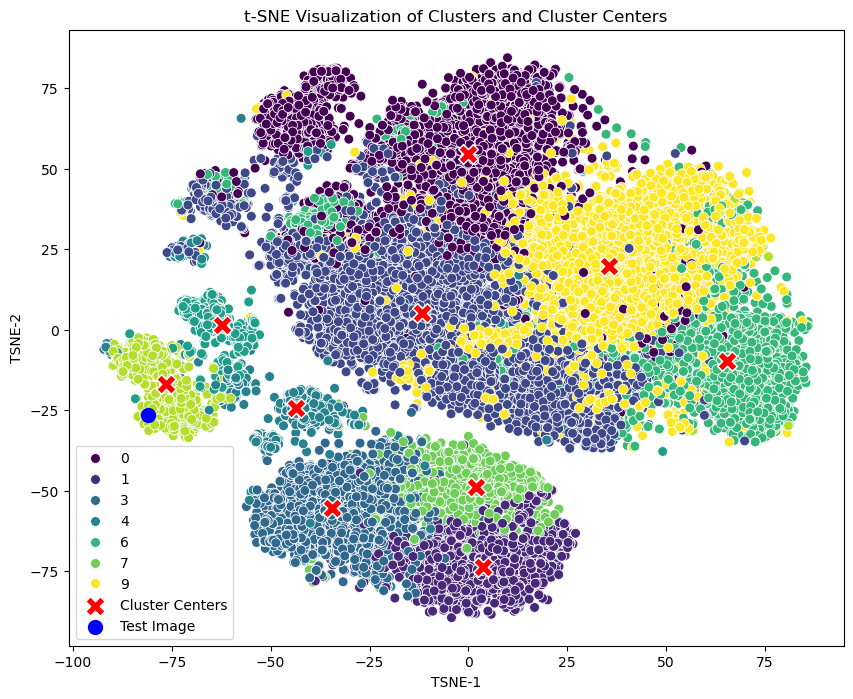

In [178]:
# Black T-shirt
import numpy as np

# Function to calculate maximum possible distance in the embedding space
def calculate_max_distance(embeddings):
    max_distance = 0
    for i in range(len(embeddings)):
        for j in range(i+1, len(embeddings)):
            distance = np.linalg.norm(embeddings[i] - embeddings[j])
            if distance > max_distance:
                max_distance = distance
    return max_distance

# Function to normalize the score
def normalize_score(score, max_distance):
    normalized_score = (score / max_distance) * 100
    return min(100, max(0, normalized_score))  # Ensure the score is between 0 and 100

# Calculate maximum distance
max_distance = calculate_max_distance(cluster_centers)

# Example usage with a test image
img_path = '../yolo/ecommerce_dataset/train/images/dataset_vestidos_2344.png'  # Update with the path to the uploaded image
extracted_clothes = extract_clothes(img_path)

# Generate embeddings for extracted clothes
topwear_embedding = get_embedding_from_image(embedding_model, extracted_clothes['topwear']) if 'topwear' in extracted_clothes else None
bottomwear_embedding = get_embedding_from_image(embedding_model, extracted_clothes['bottomwear']) if 'bottomwear' in extracted_clothes else None
footwear_embedding = get_embedding_from_image(embedding_model, extracted_clothes['footwear']) if 'footwear' in extracted_clothes else None

# Calculate and normalize uniqueness scores
if topwear_embedding is not None:
    topwear_uniqueness = calculate_uniqueness(topwear_embedding, cluster_centers)
    normalized_topwear_uniqueness = normalize_score(topwear_uniqueness, max_distance)
    print(f"Topwear Uniqueness: {topwear_uniqueness} (Normalized: {normalized_topwear_uniqueness:.2f}%)")
    plot_clusters_and_test_image(tsne_embeddings, tsne_cluster_centers, topwear_embedding, cluster_centers)

if bottomwear_embedding is not None:
    bottomwear_uniqueness = calculate_uniqueness(bottomwear_embedding, cluster_centers)
    normalized_bottomwear_uniqueness = normalize_score(bottomwear_uniqueness, max_distance)
    print(f"Bottomwear Uniqueness: {bottomwear_uniqueness} (Normalized: {normalized_bottomwear_uniqueness:.2f}%)")
    # plot_clusters_and_test_image(tsne_embeddings, tsne_cluster_centers, bottomwear_embedding, cluster_centers)

if footwear_embedding is not None:
    footwear_uniqueness = calculate_uniqueness(footwear_embedding, cluster_centers)
    normalized_footwear_uniqueness = normalize_score(footwear_uniqueness, max_distance)
    print(f"Footwear Uniqueness: {footwear_uniqueness} (Normalized: {normalized_footwear_uniqueness:.2f}%)")
    # plot_clusters_and_test_image(tsne_embeddings, tsne_cluster_centers, footwear_embedding, cluster_centers)
